# Experiment 07: Implementació de la xarxa neuronal Double U-Net per a la segmentació de ferides i grapes alhora

Carregarem els paquets necessaris

In [1]:
import cv2
import glob
import numpy 
import os
import skimage

import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from matplotlib import pyplot as plt
from numpy.random import seed
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import backend 
from tensorflow.keras.optimizers import *
from typing import Tuple, List

os.environ["CUDA_VISIBLE_DEVICES"]="-1"
seed(1)

2024-06-30 17:27:29.903467: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


## Lectura del *Redscar Dataset* i implementació del generador

Les imatges que s'empraran per a fer l'entrenament les anirem carregant a mesura que la xarxa les demani, per evitar carregar tot el dataset en memòria. Primer de tot, establirem la ruta del dataset.

In [2]:
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_ML_DATASET = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET')
REDSCAR_DATASET_IMAGES = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'IMAGES')
REDSCAR_DATASET_MASKS_WOUND = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_WOUND_MASK')
REDSCAR_DATASET_MASKS_STAPLE = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_STAPLES_MASK')

In [3]:
# # DESCOMENTAR PER FER UNA CÀRREGA DES DE ZERO. ALTERNATIVAMENT, EMPRAR EL DATASET JA CARREGAT DINS MEMÒRIA
# def process_image(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     img = cv2.imread(os.path.join(path, image_name), 1)
#     img = skimage.transform.resize(img, (size[0], size[1], 3))
#     return img

# def process_gt(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     mask = cv2.imread(os.path.join(path, image_name), 0)
#     mask = cv2.resize(mask, size)

#     mask = mask/255
#     mask[mask < 0.5] = 0
#     mask[mask >= 0.5] = 1
#     return mask

# with open(os.path.join(REDSCAR_ML_DATASET, "train.txt")) as train_file:
#     TRAIN_IMAGES_NAMES = [line.rstrip() for line in train_file]
    
# with open(os.path.join(REDSCAR_ML_DATASET, "test.txt")) as test_file:
#     TEST_IMAGES_NAMES = [line.rstrip() for line in test_file]

# print("-> Loading original images on train set.")
# IMAGES_TRAIN = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading original images on test set.")
# IMAGES_TEST = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on train set.")
# GROUND_TRUTHS_WOUND_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on test set.")
# GROUND_TRUTHS_WOUND_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on train set.")
# GROUND_TRUTHS_STAPLE_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on test set.")
# GROUND_TRUTHS_STAPLE_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]

%store -r IMAGES_TRAIN
%store -r IMAGES_TEST
%store -r GROUND_TRUTHS_WOUND_TRAIN
%store -r GROUND_TRUTHS_WOUND_TEST
%store -r GROUND_TRUTHS_STAPLE_TRAIN
%store -r GROUND_TRUTHS_STAPLE_TEST

In [4]:
def cnn_generator(images: List[numpy.array], 
                  masks_wound: List[numpy.array], 
                  masks_staple: List[numpy.array],
                  batch_size: int):
    assert (len(images)==len(masks_wound)) and (len(images)==len(masks_staple)), "The number of images and masks to be used must match." 
    batch_img = []
    batch_masks = []
    idx = 1
    
    while(True):
        batch_img.append(images[idx % len(images)])
        batch_masks.append(numpy.dstack((masks_wound[idx % len(images)], 
                                         masks_staple[idx % len(images)])))
        
        if (idx % batch_size == 0) and idx != 0:            
            batch_img = numpy.array(batch_img)
            batch_masks = numpy.array(batch_masks)
            
            yield batch_img, batch_masks
            
            batch_img = []
            batch_masks = []
        idx += 1

(5, 256, 256, 3) (5, 256, 256, 2)


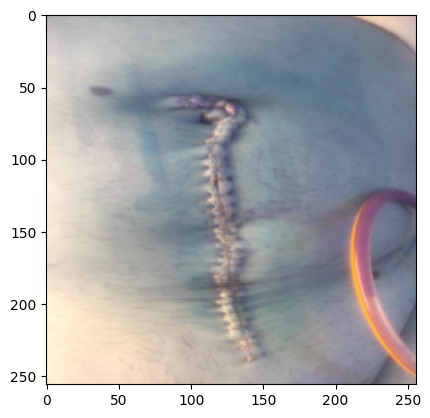

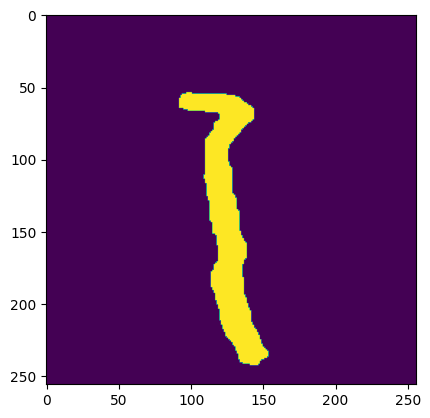

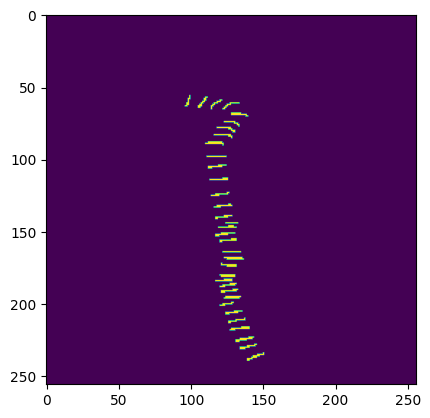

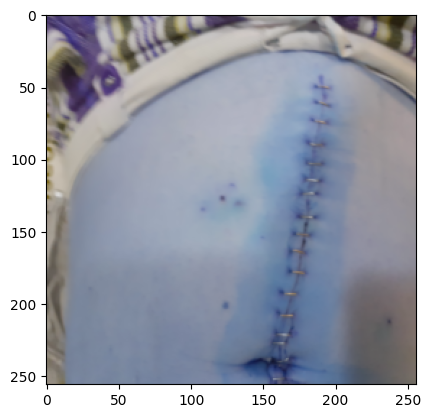

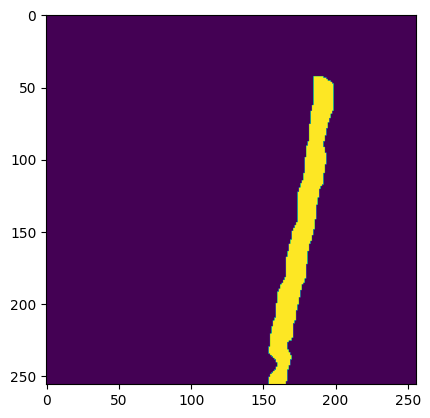

...

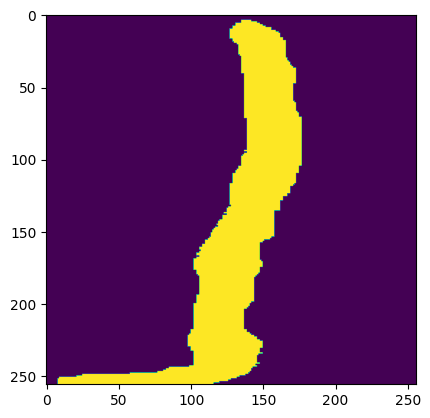

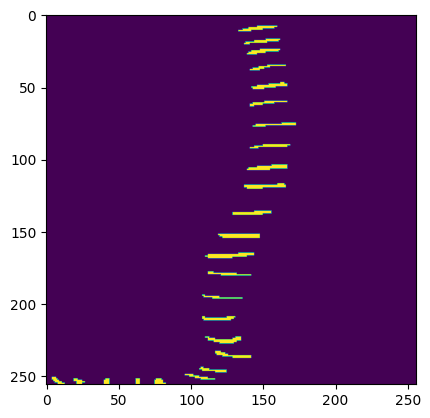

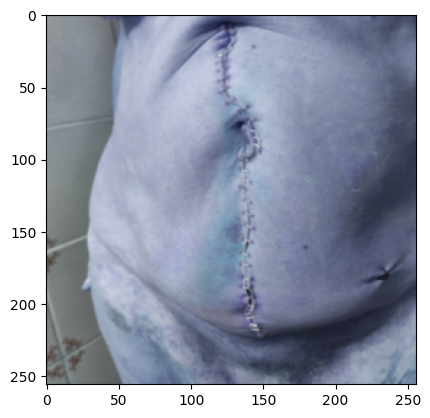

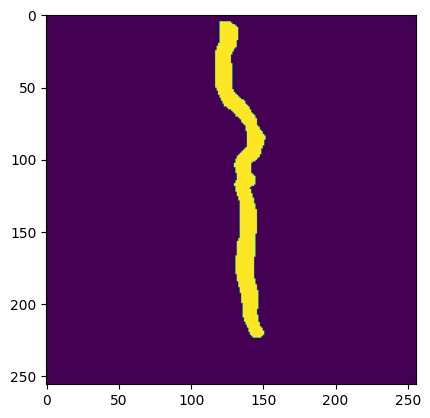

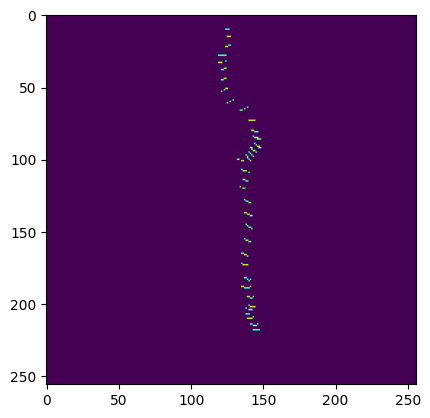

In [5]:
BATCH_SIZE = 5
for image_batch, mask_batch in cnn_generator(images=IMAGES_TRAIN,
                                             masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                             masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                             batch_size=BATCH_SIZE):
    print(image_batch.shape, mask_batch.shape)
    for i in range(0, BATCH_SIZE):
        plt.imshow(image_batch[i,:,:,:])
        plt.show()
        plt.imshow(mask_batch[i,:,:,0])
        plt.show()
        plt.imshow(mask_batch[i,:,:,1])
        plt.show()
    break

(5, 256, 256, 3) (5, 256, 256, 2)


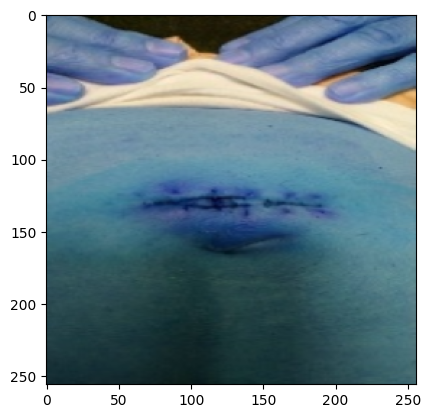

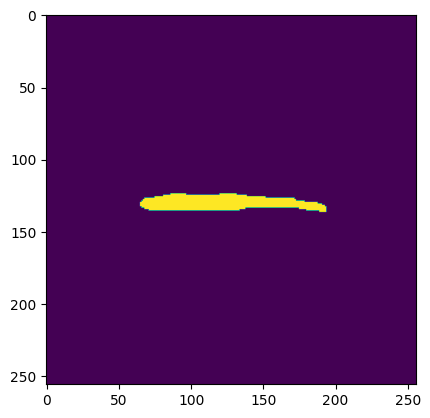

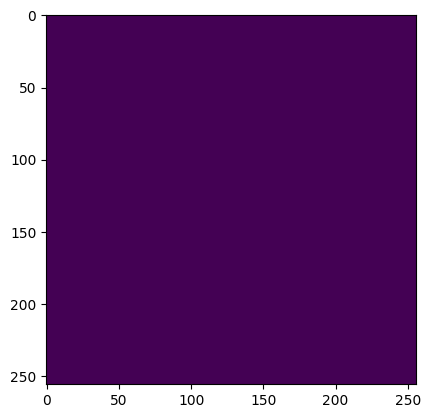

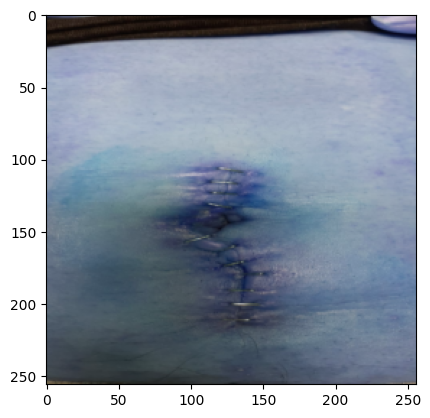

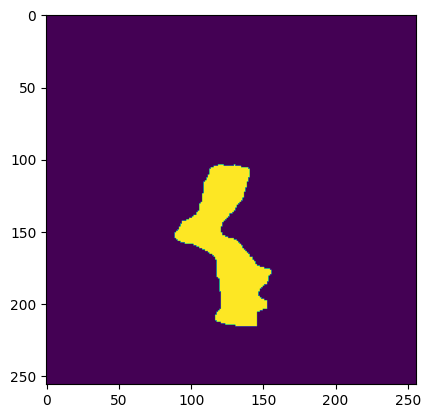

...

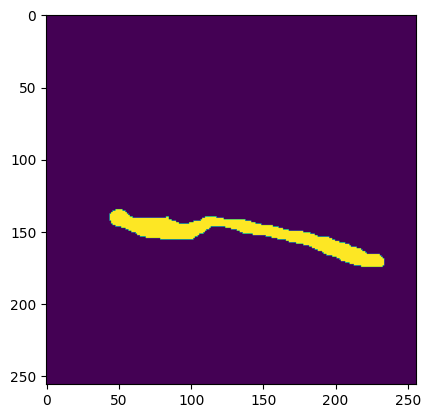

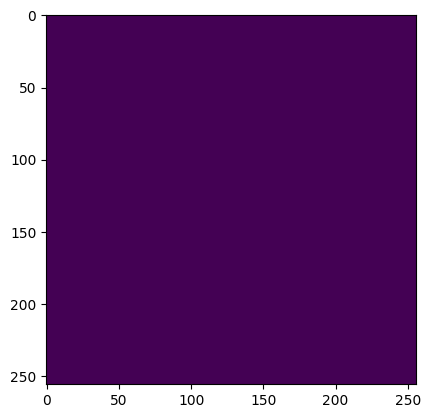

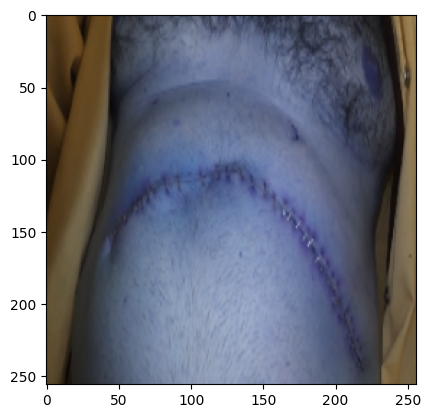

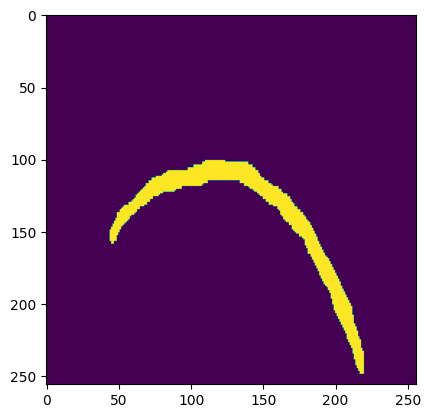

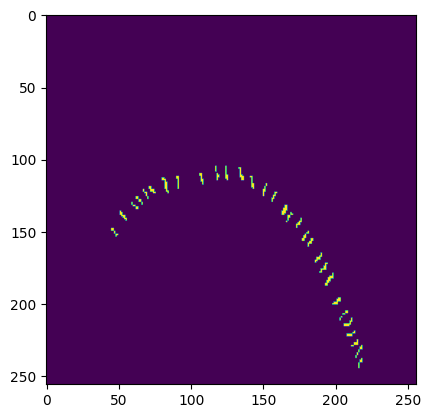

In [6]:
BATCH_SIZE = 5
for image_batch, mask_batch in cnn_generator(images=IMAGES_TEST,
                                             masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                             masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                             batch_size=BATCH_SIZE):
    print(image_batch.shape, mask_batch.shape)
    for i in range(0, BATCH_SIZE):
        plt.imshow(image_batch[i,:,:,:])
        plt.show()
        plt.imshow(mask_batch[i,:,:,0])
        plt.show()
        plt.imshow(mask_batch[i,:,:,1])
        plt.show()
    break

## Implementació de la Double U-Net:

El model inicial fou presentadt a *DoubleU-Net: A Deep Convolutional Neural
Network for Medical Image Segmentation*. 

In [7]:
from tensorflow.keras.applications import VGG19

from cnn_architectures.architectures.models.double_unet.layers import ASPP, ConvolutionalBlock, OutputBlock

def build_double_unet_right_network(x: tf.Tensor, skipped_connections: List[tf.Tensor]):
    skipped_connections_2 = []
    for idx, filter_size in enumerate([32, 64, 128, 256]):
        x = ConvolutionalBlock(filters=filter_size)(x)
        skipped_connections_2.append(x)
        x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
    
    x = ASPP(filters=64, input_shape=x.shape)(x)
    
    for idx, filter_size in enumerate([256, 128, 64, 32]):
        x = tf.keras.layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(x)
        x = tf.keras.layers.concatenate([x, skipped_connections[4 - (idx + 1)], skipped_connections_2[4 - (idx + 1)]])
        x = ConvolutionalBlock(filters=filter_size)(x)
    
    output = OutputBlock()(x)
    return output

def build_double_unet(input_shape=Tuple[int,int,int]):
    inputs = tf.keras.layers.Input(input_shape) 
    
    vgg = VGG19(include_top=False, weights='imagenet', input_tensor=inputs)
    x = vgg.get_layer("block5_conv4").output
    
    names = ["block1_conv2", "block2_conv2", "block3_conv4", "block4_conv4"]
    skipped_connections = []
    for name in names:
        skipped_connections.append(vgg.get_layer(name).output)
    x = ASPP(filters=64, input_shape=x.shape)(x)
    
    for idx, filter_size in enumerate([256, 128, 64, 32]):
        x = tf.keras.layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(x)
        x = tf.keras.layers.concatenate([x, skipped_connections[4 - (idx + 1)]])
        x = ConvolutionalBlock(filters = filter_size)(x)
        
    intermediate_output = OutputBlock()(x) # OUTPUT 1 DE LA GRÀFICA DE LA XARXA
    
    x = inputs * intermediate_output

    output0 = build_double_unet_right_network(x=x, skipped_connections=skipped_connections)
    output1 = build_double_unet_right_network(x=x, skipped_connections=skipped_connections)

    outputs = tf.keras.layers.concatenate([output0, output1], axis = -1) 
    
    model = tf.keras.models.Model(inputs = inputs, outputs = outputs, name = 'MultitaskDoubleUnet') 
    return model


## Entrenament de la Double U-Net

Ja ho tenim quasi a punt per a fer l'entrenament. Només ens queda definir la funció de pèrdua. Emprarem el coeficient de dice atès que és una mètrica emprada usualment en aquests casos.

In [8]:
def dice(y_true, y_pred):
    y_true_f = backend.flatten(y_true)
    y_pred_f = backend.flatten(y_pred)
    intersection = backend.sum(y_true_f * y_pred_f)
    return (2.* intersection+1) / (backend.sum(y_true_f) + backend.sum(y_pred_f)+1 )  
    
def dice_wound(y_true_multitask, y_pred_multitask):
    return dice(y_true_multitask[0], y_pred_multitask[0])

def dice_staple(y_true_multitask, y_pred_multitask):
    return dice(y_true_multitask[1], y_pred_multitask[1])

def dice_mean(y_true_multitask, y_pred_multitask):
    dice_f = dice_wound(y_true_multitask, y_pred_multitask)
    dice_g = dice_staple(y_true_multitask, y_pred_multitask)
    weight = 1/2
    return weight*dice_f + (1-weight)*dice_g

def dice_loss(y_true_multitask, y_pred_multitask):
    return 1-dice_mean(y_true_multitask, y_pred_multitask)

Cal fer algunes proves per a seleccionar el millor learning rate i el nombre d'èpoques a entrenar el model

In [ ]:
alphas = [2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 7e-5, 5e-5]
for a in alphas:
    double_unet = build_double_unet(input_shape=(256, 256, 3))
    double_unet.compile(optimizer=Adam(learning_rate = a), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
    BATCH_SIZE = 5
    TOTAL_IMAGES_TRAIN = 275
    TOTAL_IMAGES_TEST = 119
    STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
    VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
    EPOCHS = 70

    reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                       patience=3,
                                       verbose=1, mode='max', cooldown=2, min_lr=1e-7)
    early = EarlyStopping(monitor="dice_mean",
                          mode="max",
                          patience=8)

    CALLBACKS = [early, reduceLROnPlat]

    TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                                masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                batch_size=BATCH_SIZE)

    TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                                   masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                   masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                   batch_size=BATCH_SIZE)
    
    training_history = double_unet.fit(TRAIN_GENERATOR, 
                           validation_data=TEST_GENERATOR,
                           epochs=EPOCHS,
                           validation_steps=2,
                           callbacks=CALLBACKS,
                           steps_per_epoch=STEPS_PER_EPOCH)
    
    plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

    plt.subplot(1,2,1)
    plt.plot(training_history.history['dice_mean'])
    plt.plot(training_history.history['val_dice_mean'])
    plt.title('Dice evolution')
    plt.ylabel('dice')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    # "Loss"
    plt.subplot(1,2,2)
    plt.plot(training_history.history['loss'])
    plt.plot(training_history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07'
    plt.savefig(EXPERIMENT_PATH+rf"/double_unet_multitasca_rendiment_prova_{a}.png")
    
    del double_unet
    

2024-06-30 17:27:39.061107: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-30 17:27:39.070290: E tensorflow/stream_executor/cuda/cuda_driver.cc:314] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2024-06-30 17:27:39.070349: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: T-Series
2024-06-30 17:27:39.070366: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: T-Series
2024-06-30 17:27:39.070489: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:200] libcuda reported version is: 440.33.1
2024-06-30 17:27:39.070546: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:204] kernel reported version is: 440.33.1
2024-06-30 17:27:39.070560: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:310] kernel version seems to match DSO: 440.33.1
2024-06-30 17:27:39.071057: I tensorflow/core/platform/cpu_feature

Epoch 1/50
55/55 [==============================] - 505s 9s/step - loss: 0.8581 - dice_mean: 0.1419 - dice_wound: 0.1416 - dice_staple: 0.1422 - val_loss: 0.9439 - val_dice_mean: 0.0561 - val_dice_wound: 0.0320 - val_dice_staple: 0.0803
Epoch 2/50
55/55 [==============================] - 503s 9s/step - loss: 0.8206 - dice_mean: 0.1794 - dice_wound: 0.1808 - dice_staple: 0.1780 - val_loss: 0.9162 - val_dice_mean: 0.0838 - val_dice_wound: 0.1009 - val_dice_staple: 0.0667
Epoch 3/50
55/55 [==============================] - 508s 9s/step - loss: 0.7885 - dice_mean: 0.2115 - dice_wound: 0.2160 - dice_staple: 0.2069 - val_loss: 0.8461 - val_dice_mean: 0.1539 - val_dice_wound: 0.1960 - val_dice_staple: 0.1119
Epoch 4/50
55/55 [==============================] - 553s 10s/step - loss: 0.7445 - dice_mean: 0.2555 - dice_wound: 0.2588 - dice_staple: 0.2523 - val_loss: 0.8889 - val_dice_mean: 0.1111 - val_dice_wound: 0.0712 - val_dice_staple: 0.1510
Epoch 5/50
55/55 [==============================] -

55/55 [==============================] - 504s 9s/step - loss: 0.1629 - dice_mean: 0.8371 - dice_wound: 0.8356 - dice_staple: 0.8386 - val_loss: 0.2866 - val_dice_mean: 0.7134 - val_dice_wound: 0.8529 - val_dice_staple: 0.5739
Epoch 35/50
55/55 [==============================] - 502s 9s/step - loss: 0.1804 - dice_mean: 0.8196 - dice_wound: 0.8172 - dice_staple: 0.8220 - val_loss: 0.3245 - val_dice_mean: 0.6755 - val_dice_wound: 0.6483 - val_dice_staple: 0.7028
Epoch 36/50
55/55 [==============================] - 503s 9s/step - loss: 0.1725 - dice_mean: 0.8275 - dice_wound: 0.8239 - dice_staple: 0.8311 - val_loss: 0.3541 - val_dice_mean: 0.6459 - val_dice_wound: 0.7876 - val_dice_staple: 0.5041
Epoch 37/50
55/55 [==============================] - 501s 9s/step - loss: 0.1565 - dice_mean: 0.8435 - dice_wound: 0.8390 - dice_staple: 0.8480 - val_loss: 0.2660 - val_dice_mean: 0.7340 - val_dice_wound: 0.7466 - val_dice_staple: 0.7214
Epoch 38/50
55/55 [==============================] - 502s 9s

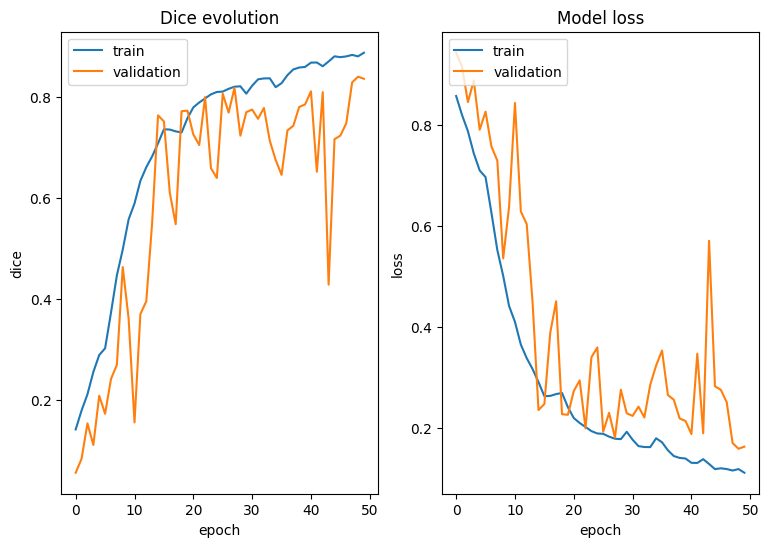

In [9]:
# CONFIGURACIÓ ÒPTIMA:
double_unet = build_double_unet(input_shape=(256, 256, 3))
double_unet.compile(optimizer=Adam(learning_rate = 4e-4), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])

BATCH_SIZE = 5
TOTAL_IMAGES_TRAIN = 275
TOTAL_IMAGES_TEST = 119
STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
EPOCHS = 50

reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                   patience=3,
                                   verbose=1, mode='max', cooldown=2, min_lr=1e-7)
early = EarlyStopping(monitor="dice_mean",
                      mode="max",
                      patience=8)

CALLBACKS = [early, reduceLROnPlat]

TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                            masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                            masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                            batch_size=BATCH_SIZE)

TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                               masks_wound=GROUND_TRUTHS_WOUND_TEST,
                               masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                               batch_size=BATCH_SIZE)

training_history = double_unet.fit(TRAIN_GENERATOR, 
                       validation_data=TEST_GENERATOR,
                       epochs=EPOCHS,
                       validation_steps=2,
                       callbacks=CALLBACKS,
                       steps_per_epoch=STEPS_PER_EPOCH)

plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

plt.subplot(1,2,1)
plt.plot(training_history.history['dice_mean'])
plt.plot(training_history.history['val_dice_mean'])
plt.title('Dice evolution')
plt.ylabel('dice')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

# "Loss"
plt.subplot(1,2,2)
plt.plot(training_history.history['loss'])
plt.plot(training_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07'
plt.savefig(EXPERIMENT_PATH+rf"/double_unet_multitasca.png")

In [10]:
EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07'
double_unet.save(os.path.join(EXPERIMENT_PATH, "double_unet_multitasca.h5"))

In [11]:
from tensorflow.keras.models import load_model
from cnn_architectures.architectures.models.double_unet.layers import ASPP, ConvolutionalBlock, OutputBlock
EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07'
loaded_model = load_model(os.path.join(EXPERIMENT_PATH, "double_unet_multitasca.h5"), 
                          custom_objects={'dice_loss': dice_loss, 
                                          'dice_mean': dice_mean,
                                          'dice_wound': dice_wound, 
                                          'dice_staple': dice_staple,
                                          'dice': dice,
                                          'ASPP': ASPP,
                                          'ConvolutionalBlock': ConvolutionalBlock, 
                                          'OutputBlock': OutputBlock})

## Prediccions amb la Double-UNet 

Fins ara hem implementat la Double-UNet , l'hem entrenat i hem guardat els pesos a un fitxer per a poder fer futures prediccions. Això és el que pretenem fer en aquesta secció: passar-li una imatge a la Double-UNet, i que ens faci la predicció. 

És important observar un fet: quan li passam imatges amb el generador, li estem donant amb una certa mida, i la xarxa ens torna les imatges també amb una certa mida de sortida. Però clar, no totes les imatges del dataset tenen la mateixa mida, ni tampoc tenen la mateixa mida $256\times 256$ que li imposam a la xarxa. Per aquest motiu, és important establir un criteri. Com que les màscares ens determinen la posició exacta de l'objecte, farem el següent:

1. Donada una imatge sobre la que volem fer la predicció, canviar la seva mida a la dimensió d'entrada de la xarxa.
2. Calcular la predicció del model, que ens tornarà una imatge en la dimensió de sortida del mateix. Aquesta sortida serà, **en el cas de la Double-UNet**, una imatge amb entrades dins l'interval $[0,1]$, que podem interpretar com una imatge en escala de grisos.
3. Redimensionar aquesta sortida amb les dimensions de la imatge en qüestió.
4. Binaritzar el resultat de la passa anterior.
5. Comparar amb la màscara.

Un dubte que pot sorgir és si les passes 3 i 4 es poden permutar. La resposta és que no. Si primer binaritzam, quan facem el canvi d'escala posterior la imatge resultant **no** és, en general, binària. Hem de pensar que fer un canvi d'escala aplica per darrere una sèrie de tècniques d'interpolació, que poden donar lloc a imatges en escala de grisos, que no són comparables a la passa 4 amb la màscara final.

In [12]:
def predict_image(model: tf.keras.models.Model, model_input: Tuple[int, int], image: numpy.ndarray, binary_threshold: float=0.5):
    resized_image = skimage.transform.resize(image, (model_input[0], model_input[1], 3)) #Passa 1
    prediction_raw = model.predict(numpy.array([resized_image])) # Passa 2
    
    #PREDICCIO FERIDA
    # Passa 3
    prediction_f = prediction_raw[0][:,:,0]
    prediction_resized_f = skimage.transform.resize(prediction_f, (image.shape[0], image.shape[1]))
    prediction_binary_bool_f = prediction_resized_f >= binary_threshold # passa 4
    prediction_binary_f = 255*prediction_binary_bool_f
    
    #PREDICCIO GRAPA
    prediction_g = prediction_raw[0][:,:,1]
    prediction_resized_g = skimage.transform.resize(prediction_g, (image.shape[0], image.shape[1]))
    prediction_binary_bool_g = prediction_resized_g >= binary_threshold
    prediction_binary_g = 255*prediction_binary_bool_g
    
    return prediction_binary_f, prediction_binary_g

In [10]:
# test_image_name = "BZuyAY51Mf43RKhhnsromiPaN_infection=0_capture=0_resolution=1.png"
# original_image = cv2.imread(os.path.join(REDSCAR_DATASET_TEST, "IMAGES", test_image_name))
# gt_image_f = cv2.imread(os.path.join(REDSCAR_DATASET_TEST, "GT_WOUND_MASK", test_image_name), 0)
# gt_image_g = cv2.imread(os.path.join(REDSCAR_DATASET_TEST, "GT_STAPLES_MASK", test_image_name), 0)

# #result = predict_image(model=double_unet, model_input=(256, 256), image=original_image)
# # En lloc de double_unet també podem passar loaded_model. Són el mateix model i per tant fan la mateixa predicció.
# prediction_f, prediction_g = predict_image(model=loaded_model, model_input=(256, 256), image=original_image)

In [11]:
# plt.imshow(original_image)
# plt.show()

# plt.imshow(gt_image_f)
# plt.show()
# print(gt_image_f.size)

# plt.imshow(prediction_f)
# plt.show()
# print(prediction_f.size)

# plt.imshow(gt_image_g)
# plt.show()

# plt.imshow(prediction_g)
# plt.show()

Ara implementarem dues funcions que reben per paràmetres la gt i la predicció i ens retornen la mètrica: la dice i la jaccard.

In [12]:
from sklearn.metrics import confusion_matrix
def metriques_absolutes(gt_image, prediction):
    (n,m) = numpy.shape(gt_image)  
    
    if (n,m) != numpy.shape(prediction): # comprovació que les mides de la imatge de la predicció i la de la gt coincideixen
        return []
    
    # si les mides coincideixen, calcularem les mètriques absolutes
    # Convert images to binary arrays
    gt_binary = numpy.asarray(gt_image).ravel()
    gt_binary = gt_binary.astype(int)
    gt_binary = 255*gt_binary
    prediction_binary = numpy.asarray(prediction).ravel()
    
    # Calculate confusion matrix
    cm = confusion_matrix(gt_binary, prediction_binary)
    if cm.shape[0] > 1 and cm.shape[1] > 1:
        tn, fp, fn, tp = confusion_matrix(gt_binary, prediction_binary).ravel()
        return [tp, fn, fp, tn]
    return [confusion_matrix(gt_binary, prediction_binary)[0]]

In [13]:
def dice_coefficient(gt_image, prediction):
    metriques = metriques_absolutes(gt_image, prediction)  
    
    if len(metriques)<=1:
        return []
    
    [tp,fn,fp,tn] = metriques
    # calculem el valor del coeficient de dice
    if (2*tp + fp + fn) == 0: #això voldria dir que tots el coefs. són TN i, per tant, ho fa bé
        dice = 1
    else:
        dice = 2*tp/(2*tp + fp + fn)
    
    return [tp,fn,fp,tn,dice]

In [14]:
def jaccard_coefficient(gt_image, prediction):
    metriques = metriques_absolutes(gt_image, prediction)
    
    if metriques == []:
        return []
    
    [tp,fn,fp,tn] = metriques
    # calculem el valor del coeficient de jaccard
    if (tp + fp + fn) == 0: #com abans, la predicció és bona
        jaccard = 1
    else:
        jaccard = tp/(tp + fp + fn)
    
    return [tp,fn,fp,tn,jaccard]

Amb aquesta informació, tenim dubtes entre diversos $LR$, motiu pel qual cal realitzar diversos contrastos d'hipòtesis.
Primer caldrà usar uns subprogrames per tal de realitzar les diverses proves:

In [15]:
import pandas as pd
# Read the .txt file into a DataFrame
path_train = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'train.txt')
df = pd.read_csv(path_train, header=None)

# Convert DataFrame to a flattened list
noms_train = df.values.ravel().tolist()

In [16]:
def train_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TRAIN)):
        print(i)

        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TRAIN[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TRAIN[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TRAIN[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    unet_train = pd.DataFrame({'NOM': noms_train, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
    unet_train.to_csv(EXPERIMENT_PATH+rf"/unet_multitasca_train_prova_{alpha}.csv", index=False)


In [17]:
# Read the .txt file into a DataFrame
path_test = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'test.txt')
df = pd.read_csv(path_test, header=None)

# Convert DataFrame to a flattened list
noms_test = df.values.ravel().tolist()

In [18]:
def test_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TEST)):
        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TEST[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TEST[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TEST[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    unet_test = pd.DataFrame({'NOM': noms_test, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
    unet_test.to_csv(EXPERIMENT_PATH+rf"/unet_multitasca_test_prova_{alpha}.csv", index=False)


Ara sí, tornem a fer proves per a determinar l'òptim:

In [ ]:
dubtosos = [4e-4, 5e-4, 7e-4, 8e-4]
for d in dubtosos:
    # primer, cal inicialitzar la xarxa i entrenar-la amb els nous paràmetres:
    double_unet = build_double_unet(input_shape=(256, 256, 3))
    double_unet.compile(optimizer=Adam(learning_rate = d), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
    BATCH_SIZE = 5
    TOTAL_IMAGES_TRAIN = 275
    TOTAL_IMAGES_TEST = 119
    STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
    VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
    EPOCHS = 50

    reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                       patience=3,
                                       verbose=1, mode='max', cooldown=2, min_lr=1e-7)
    early = EarlyStopping(monitor="dice_mean",
                          mode="max",
                          patience=8)

    CALLBACKS = [early, reduceLROnPlat]

    TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                                masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                batch_size=BATCH_SIZE)

    TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                                   masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                   masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                   batch_size=BATCH_SIZE)
    
    training_history = double_unet.fit(TRAIN_GENERATOR, 
                           validation_data=TEST_GENERATOR,
                           epochs=EPOCHS,
                           validation_steps=2,
                           callbacks=CALLBACKS,
                           steps_per_epoch=STEPS_PER_EPOCH)
    
    plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

    plt.subplot(1,2,1)
    plt.plot(training_history.history['dice_mean'])
    plt.plot(training_history.history['val_dice_mean'])
    plt.title('Dice evolution')
    plt.ylabel('dice')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    # "Loss"
    plt.subplot(1,2,2)
    plt.plot(training_history.history['loss'])
    plt.plot(training_history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07'
    plt.savefig(EXPERIMENT_PATH+rf"/double_unet_multitasca_rendiment_prova2_{d}.png")
    
    # ara, avaluem-la:
    train_eval(double_unet, d)
    test_eval(double_unet, d)
    
    # en darrer lloc, cal esborrar-la 
    del double_unet

2024-06-08 13:59:34.216499: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-08 13:59:34.257618: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:06:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2024-06-08 13:59:34.257668: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-06-08 13:59:34.259900: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-06-08 13:59:34.261744: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-06-08 13:59:34.262108: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/50


## Algunes prediccions:
Per a poder veure com de bé ho fa la xarxa Double-UNet, guardarem algunes prediccions. En aquest cas, seleccionarem 15 imatges del DS (les 10 millors segons la mètrica dice i les 5 pitjors) i en guardarem a la carpeta 'Resultats' 

In [13]:
# funció ppal que cridarà a les altres:
def visualitzacions(model, noms_imatges: list, ruta_imatges: str, rutes_gt: list, input_size: int, ruta_guardar: str, titol: str):
    k = 1 
    for nom in noms_imatges:
        if nom.endswith('resolution=1.png'):
            qualitat = 1
        else:
            qualitat = 0
        # carregam la imatge, les gts i feim les prediccions
        imatge = cv2.imread(os.path.join(ruta_imatges, nom), 1) # en color
        gt_f = cv2.imread(os.path.join(rutes_gt[0], nom), 0) # escala de grisos
        gt_g = cv2.imread(os.path.join(rutes_gt[1], nom), 0) # escala de grisos
        prediccio_f, prediccio_g = predict_image(model=model, model_input=(input_size, input_size), image=imatge)
        
        # cridam a la funció que dibuixa les prediccions sobre la imatge original
        res1_f = mascara(imatge,prediccio_f)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_f.png", res1_f)
        res1_g = mascara(imatge,prediccio_g)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_g.png", res1_g)
        
        # cridam a la funció que dibuixa els contorns de la predicció i de la gt sobre la imatge original
        res2_f = contorns(imatge, prediccio_f, gt_f, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_f.png", res2_f)
        plt.imshow(res2_f)
        plt.show()
        
        res2_g = contorns(imatge, prediccio_g, gt_g, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_g.png", res2_g)
        plt.imshow(res2_g)
        plt.show()
        
        k += 1

In [14]:
# funció auxiliar que dibuixa la predicció sobre la imatge original:
def mascara(imatge, prediccio):
    mascara = imatge.copy()
    for i in range(imatge.shape[0]):
        for j in range(imatge.shape[1]):
            if prediccio[i, j] > 0:  
                mascara[i, j] = [107,183,189]  # Paint in yellow
    return mascara    

In [15]:
# funció auxiliar que dibuixa els contorns de la gt i de la prediccio sobre la imatge original:
# color gt = green; color prediccio = red
def contorns(imatge, prediccio, gt, qualitat):
    resultat = imatge.copy()
    # PREDICCIO
    # find contours with hierarchy
    contours, hier = cv2.findContours(prediccio.astype(numpy.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
                                                # how the contours are retrieved and organized, contour approximation method
    # Define sufficient enough colors for blobs (taques)
    colors = [(0, 255, 0), (0, 0, 255)] # green and red (BGR format)
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 5) #pintam la predicció de vermell
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 1) #pintam la predicció de vermell

        
    # GT
    # find contours with hierarchy
    contours, hier = cv2.findContours(gt.astype(numpy.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                                                # how the contours are retrieved and organized, contour approximation method
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 5) #pintam la gt de verd
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 1) #pintam la gt de verd
    return resultat

## Filtratge 1: millors i pitjors imatges de bona resolució

In [17]:
#carregam el df
# carregam el data frame de test:
import pandas as pd
df = pd.read_csv('/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07/unet_multitasca_test_prova_0.0004.csv')

# filtram les imatges d'alta resolució -> df1:
df1 = df[df['NOM'].str.endswith('resolution=1.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['qfBqdnHgJkPwfL4apJ8o2N4na_infection=0_capture=1_resolution=1.png',
              'KnclSSvSGyJt26zuAelrcgQ6b_infection=0_capture=1_resolution=1.png',
             'djnIcpMtGUmA2PAxIYTDpdD9y_infection=0_capture=1_resolution=1.png',
             'YzLNpYW33lmFgkqNRUKgIzj1J_infection=0_capture=1_resolution=1.png']
df1 = df1[~df1['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df1_sorted = df1.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df1_sorted)
# l'ordenam en funció del coeficient dice
df1_sorted = df1.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df1_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   8piW6sYXVXcnN0wrTngX8mo5K_infection=1_capture=...  0.864219   0.760902   
1   Klnp8hQnDh2ml8jyP7XNVyd6D_infection=0_capture=...  0.865604   0.763053   
2   c333lDWLYrwrLnm638Bhx9UiW_infection=0_capture=...  0.852743   0.743289   
3   oQrkfllb3QxLOseOZi06yDus4_infection=0_capture=...  0.744954   0.593567   
4   1Nt2Dcn2ztA8EIzggVYdBkhTb_infection=0_capture=...  0.918650   0.849540   
..                                                ...       ...        ...   
61  QH6mgcGbzsncWBu9z8LlgNI7g_infection=0_capture=...  0.788905   0.651398   
62  e7TbHkcmCVrFaBRJhi6i0mAO1_infection=0_capture=...  0.688549   0.525028   
63  8KeKFMhCEOcm5kKATQScvMm6B_infection=0_capture=...  0.733280   0.578880   
64  yew1SYJsWjJApCHX4Xc7kVajQ_infection=0_capture=...  0.569910   0.398513   
65  AAb0Z0BZMuyDQL1tQLRrCnAwb_infection=1_capture=...  0.629272   0.459078   

    TP_f  FN_f  FP_f   TN_f    DICE_g  JACCARD_g   TP_g   FN_g 

In [20]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df1_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df1_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df1_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df1_sorted.loc[i,"NOM"]
    dice_value = df1_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_doubleunet_alta = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07/doubleunet_multitasca_resultats_alta.csv'
resultats_doubleunet_alta.to_csv(RESULTATS_PATH, index=False)


['8piW6sYXVXcnN0wrTngX8mo5K_infection=1_capture=1_resolution=1.png', 'Klnp8hQnDh2ml8jyP7XNVyd6D_infection=0_capture=1_resolution=1.png', 'c333lDWLYrwrLnm638Bhx9UiW_infection=0_capture=1_resolution=1.png', 'oQrkfllb3QxLOseOZi06yDus4_infection=0_capture=1_resolution=1.png', '1Nt2Dcn2ztA8EIzggVYdBkhTb_infection=0_capture=1_resolution=1.png', 'uPEnybpUbXiloLj0aKXbbn8Cs_infection=0_capture=0_resolution=1.png', 'UQieIshG7UcDCR4gBQklCfcwS_infection=0_capture=1_resolution=1.png', '3R0NltinyMKFc1pWXWYojaUeV_infection=0_capture=1_resolution=1.png', 'D6CnlknL7nVaTzJCNAHx3BDnI_infection=1_capture=1_resolution=1.png', 'EuOzK2Deri2cMf3ftoaPRteNM_infection=0_capture=1_resolution=1.png', 'QH6mgcGbzsncWBu9z8LlgNI7g_infection=0_capture=1_resolution=1.png', 'e7TbHkcmCVrFaBRJhi6i0mAO1_infection=0_capture=0_resolution=1.png', '8KeKFMhCEOcm5kKATQScvMm6B_infection=0_capture=0_resolution=1.png', 'yew1SYJsWjJApCHX4Xc7kVajQ_infection=0_capture=1_resolution=1.png', 'AAb0Z0BZMuyDQL1tQLRrCnAwb_infection=1_capture=

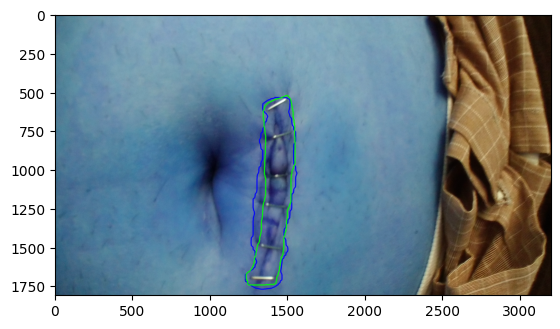

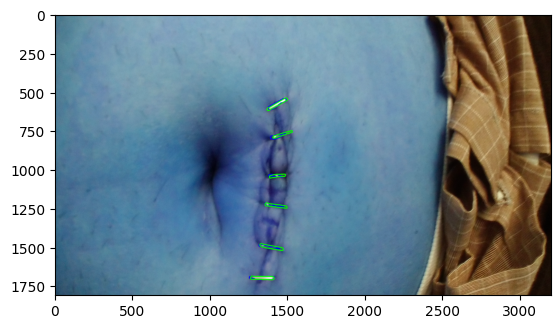

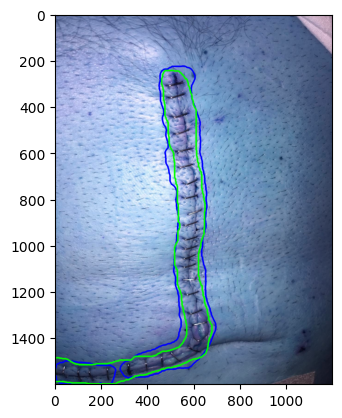

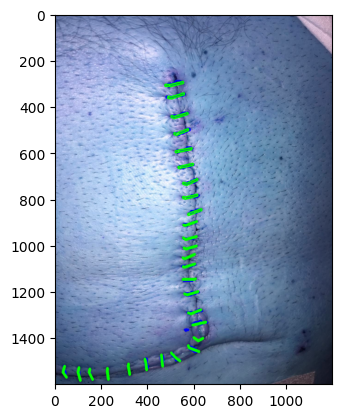

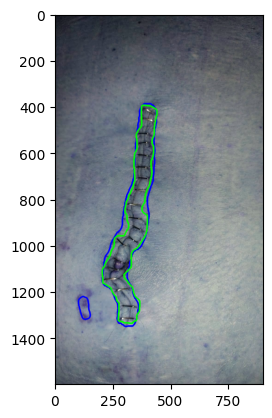

...

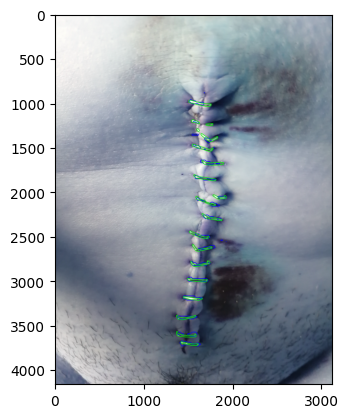

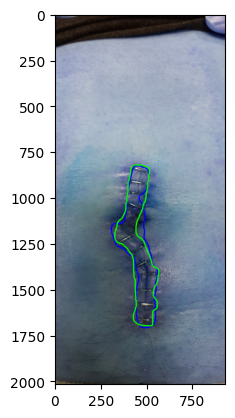

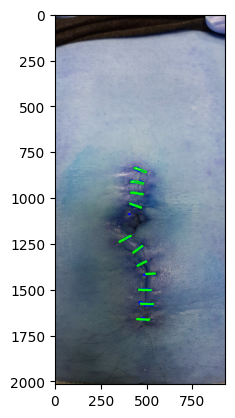

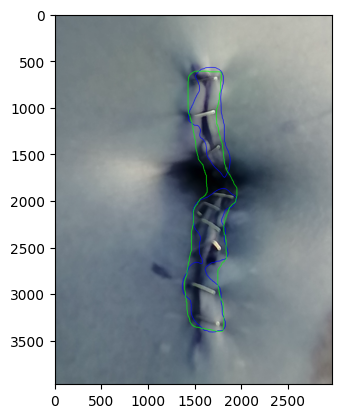

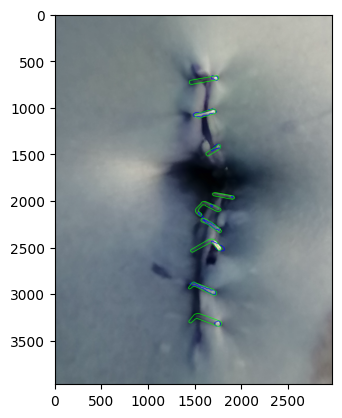

In [22]:
# guardam les millors
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_DATASET_TEST = os.path.join(REDSCAR_DATASET, "SUBSETS", "MACHINE_LEARNING_DATASET", "test")
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
ruta_gt_f = os.path.join(REDSCAR_DATASET_TEST,'GT_WOUND_MASK')
ruta_gt_g = os.path.join(REDSCAR_DATASET_TEST,'GT_STAPLES_MASK')
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
rutes_gt = [ruta_gt_f, ruta_gt_g]

ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07/alta_resolucio_10_millors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")

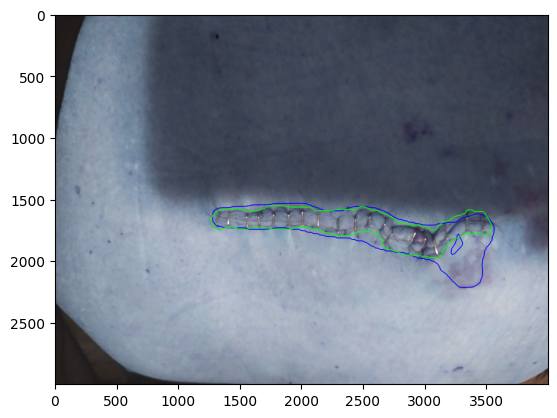

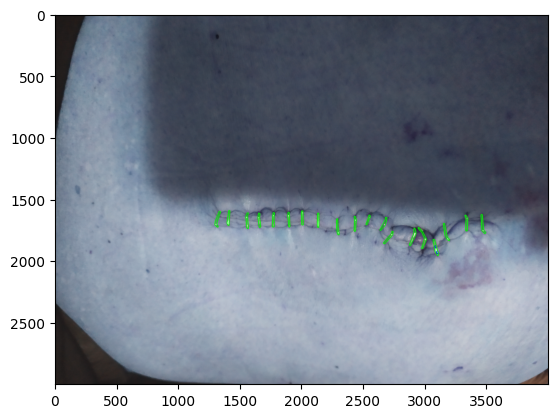

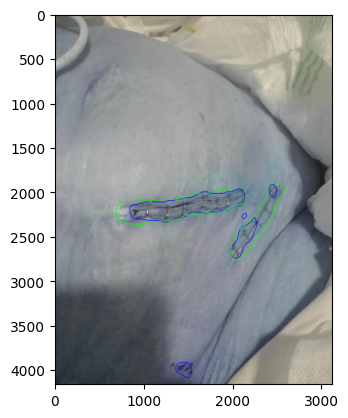

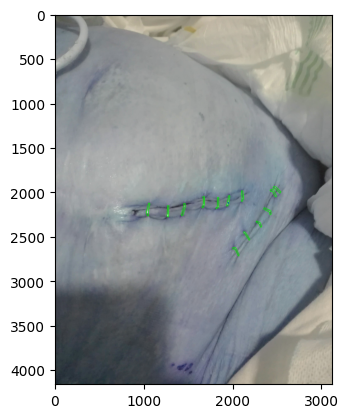

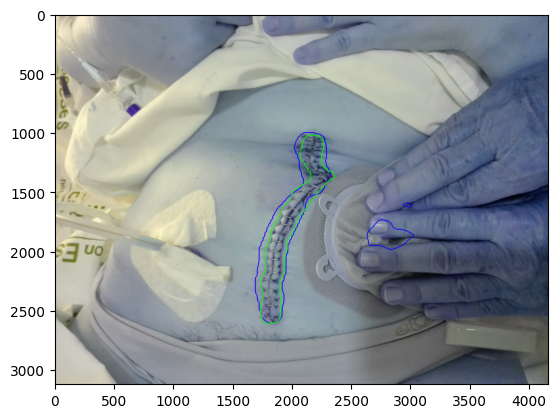

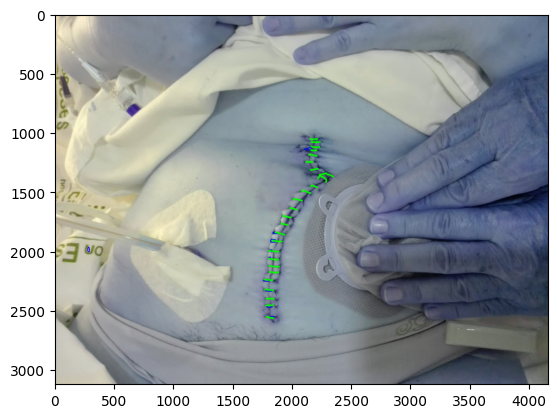

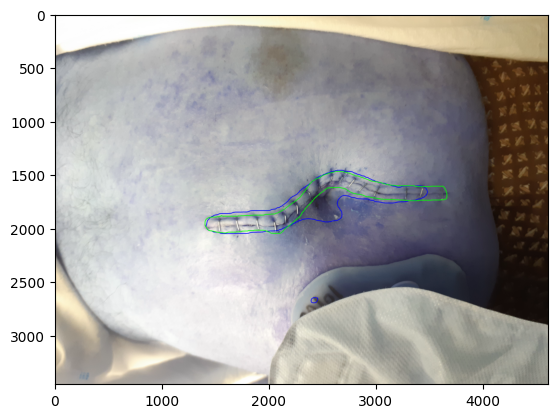

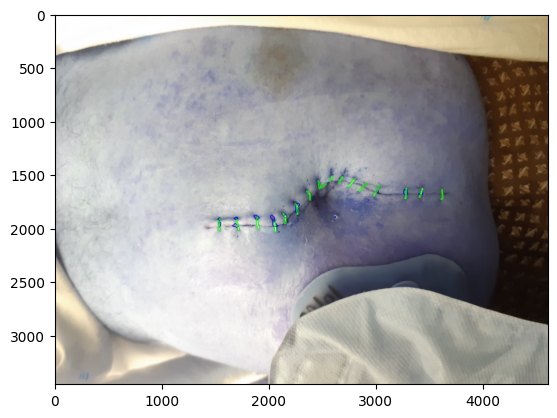

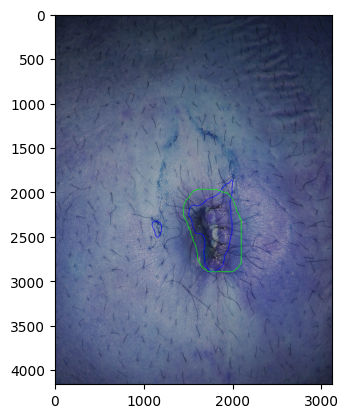

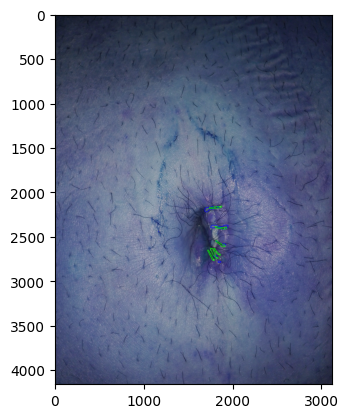

In [23]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07/alta_resolucio_5_pitjors'
# guardam les pitjors
visualitzacions(model=loaded_model, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_pitjors, titol="pitjor")


## Filtratge 2: millors i pitjors imatges de baixa resolució

In [25]:
# filtram les imatges d'alta resolució -> df2:
df2 = df[df['NOM'].str.endswith('resolution=0.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['BSmmQo7gZrySCxbaqbqcUrv2F_infection=0_capture=1_resolution=0.png',
             'fEMdP896R7Ns2a6mtbb0uGbpT_infection=0_capture=1_resolution=0.png',
             'YH30nPmh3tokV3aNsPNrFNtpt_infection=0_capture=1_resolution=0.png',
             'fgXrcZ3JaNWgGsJWrjpt8kTi8_infection=0_capture=1_resolution=0.png',
             '2XKzbg86QY1lzFzF6xyk8r49M_infection=0_capture=1_resolution=0.png']
df2 = df2[~df2['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df2_sorted = df2.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df2_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=...  0.902590   0.822473   
1   WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=...  0.850745   0.740257   
2   SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=...  0.873604   0.775574   
3   FkjbaDe3x5vbXR5g1eAR4jhQM_infection=0_capture=...  0.837262   0.720077   
4   fsQjP7gdPYnqNWbJACkayeaK8_infection=0_capture=...  0.901166   0.820111   
5   B130dg1MOeVf1euZ7ScuyO7JQ_infection=0_capture=...  0.918654   0.849547   
6   5tTSvHZ1t938soPFQt3iHl9mG_infection=0_capture=...  0.894450   0.809054   
7   wqcCQS7lvhb35bOTZj5xuw9Fy_infection=0_capture=...  0.870349   0.770458   
8   7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=...  0.865855   0.763442   
9   Cb0NA3WPBx6vM8escc4Am9S5N_infection=0_capture=...  0.851692   0.741692   
10  89Cmrsk0up7FIc0NwQcL5vvwS_infection=0_capture=...  0.866676   0.764720   
11  Q8Gc67NrWWZCNTJ39HMHWPvoj_infection=0_capture=...  0.905650 

In [26]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df2_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df2_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df2_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df2_sorted.loc[i,"NOM"]
    dice_value = df2_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_doublenet_baixa = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07/doubleunet_multitasca_resultats_baixa.csv'
resultats_doublenet_baixa.to_csv(RESULTATS_PATH, index=False)


['XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=1_resolution=0.png', 'WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=1_resolution=0.png', 'SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=1_resolution=0.png', 'FkjbaDe3x5vbXR5g1eAR4jhQM_infection=0_capture=1_resolution=0.png', 'fsQjP7gdPYnqNWbJACkayeaK8_infection=0_capture=1_resolution=0.png', 'B130dg1MOeVf1euZ7ScuyO7JQ_infection=0_capture=1_resolution=0.png', '5tTSvHZ1t938soPFQt3iHl9mG_infection=0_capture=1_resolution=0.png', 'wqcCQS7lvhb35bOTZj5xuw9Fy_infection=0_capture=1_resolution=0.png', '7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=1_resolution=0.png', 'Cb0NA3WPBx6vM8escc4Am9S5N_infection=0_capture=1_resolution=0.png', 'cPYhmZcbJwrTse9ivAwswH3aR_infection=0_capture=1_resolution=0.png', '80ZIFB9V8RO7fjnFjnU305hnW_infection=0_capture=1_resolution=0.png', 'eLAueFsX2uuS8St1LLQo0uAVI_infection=0_capture=1_resolution=0.png', 'cTiK8ZgzLbF0IPJCdOmxdRieJ_infection=0_capture=1_resolution=0.png', 'Nnq9VMIujxGziNrbm89UxZ6SK_infection=0_capture=

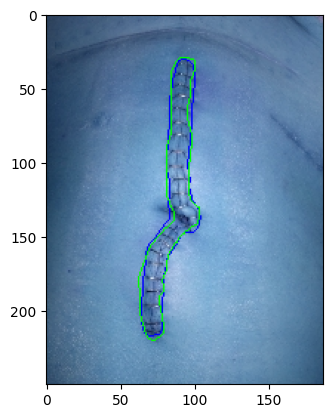

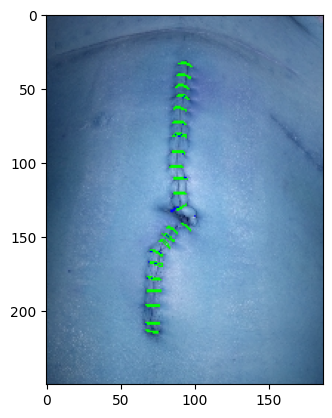

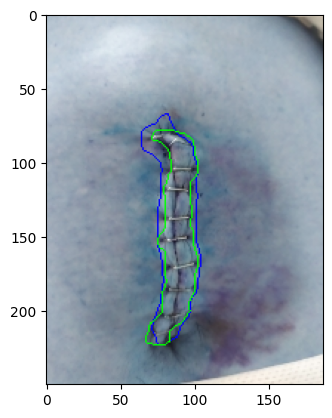

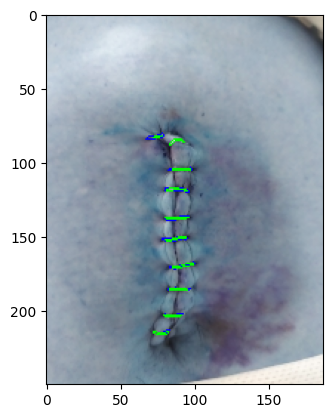

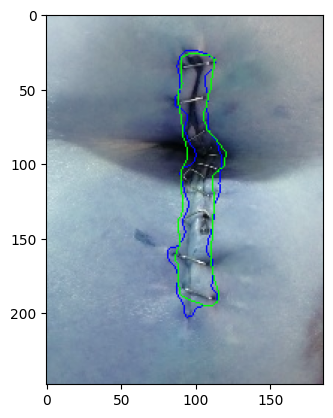

...

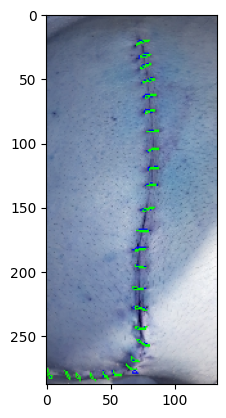

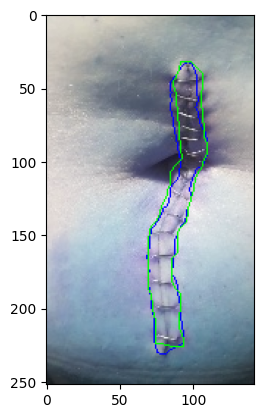

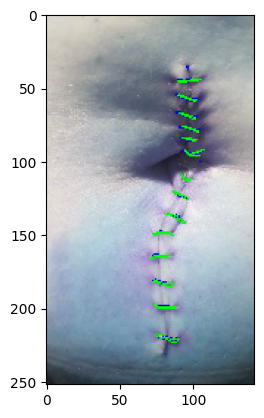

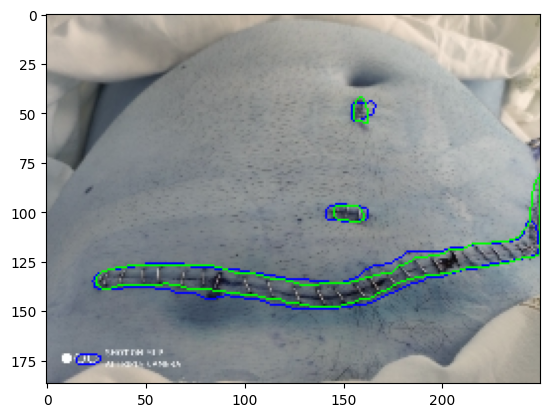

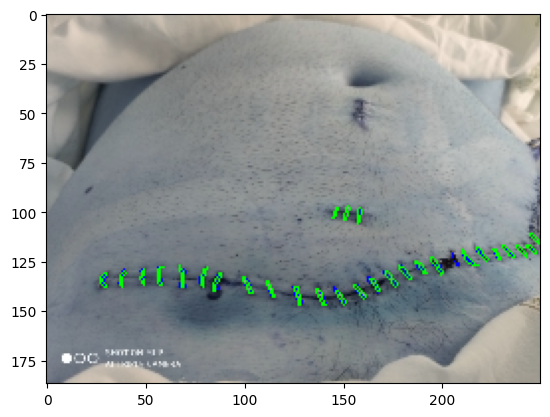

In [27]:
ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07/baixa_resolucio_10_millors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")


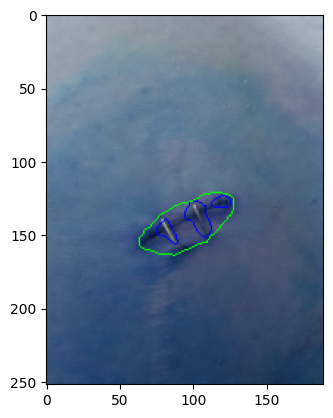

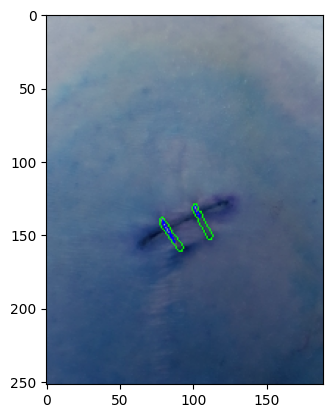

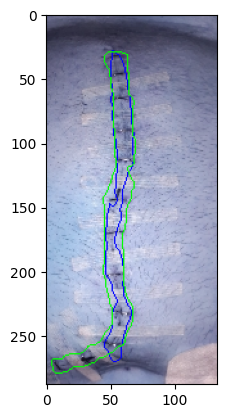

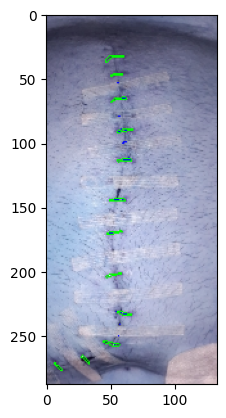

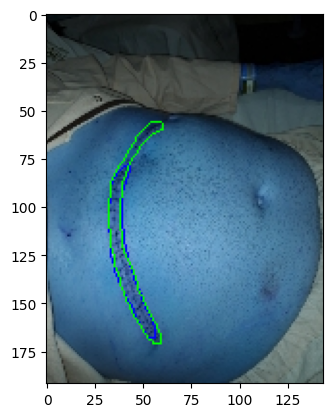

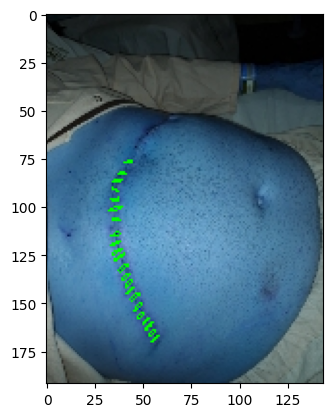

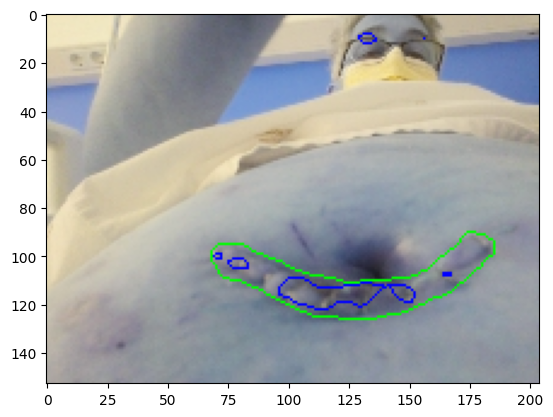

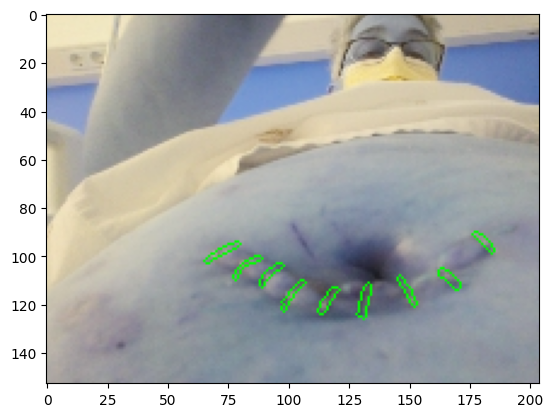

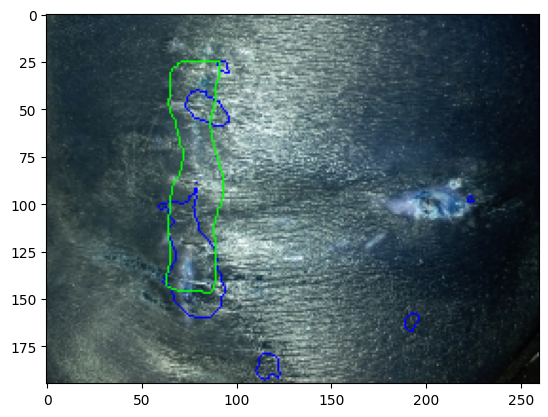

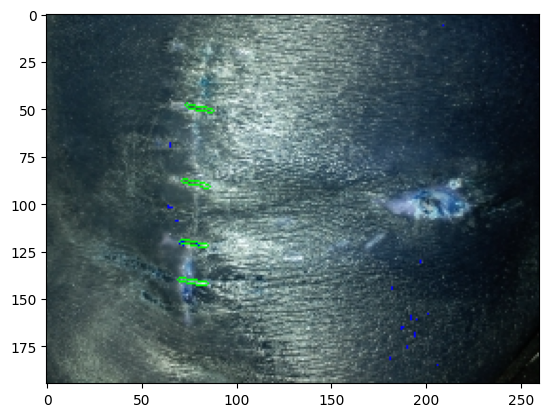

In [28]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment07/baixa_resolucio_5_pitjors'
# guardam les pitjors
visualitzacions(model=loaded_model, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_pitjors, titol="pitjor")
